In [264]:
from pandas import Series, DataFrame
import numpy as np 
import pandas as pd
import re

from plotly.subplots import make_subplots
from plotly import figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go

from patsy import dmatrices
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn import metrics

# Importing Dataset

In [265]:
df = pd.read_csv(r'/Users/dhruvarora/Documents/UT Austin/Data Science Programming/Group Project/car_insurance_claim.csv')
df.shape

(10302, 27)

In [266]:
df.columns

Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY'],
      dtype='object')

In [267]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10302 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          10302 non-null  int64  
 1   KIDSDRIV    10302 non-null  int64  
 2   BIRTH       10302 non-null  object 
 3   AGE         10295 non-null  float64
 4   HOMEKIDS    10302 non-null  int64  
 5   YOJ         9754 non-null   float64
 6   INCOME      9732 non-null   object 
 7   PARENT1     10302 non-null  object 
 8   HOME_VAL    9727 non-null   object 
 9   MSTATUS     10302 non-null  object 
 10  GENDER      10302 non-null  object 
 11  EDUCATION   10302 non-null  object 
 12  OCCUPATION  9637 non-null   object 
 13  TRAVTIME    10302 non-null  int64  
 14  CAR_USE     10302 non-null  object 
 15  BLUEBOOK    10302 non-null  object 
 16  TIF         10302 non-null  int64  
 17  CAR_TYPE    10302 non-null  object 
 18  RED_CAR     10302 non-null  object 
 19  OLDCLAIM    10302 non-nul

id ---->remove                                                 done

kidsdriv---,3,4 can be used for anlaysis                    done

birth  -->format, date,years,month extraction                    done

age ---> 7 null values  16-81 blanks (16,17 legal or not)          done     

homekids --fine

yoj 0-23, blanks are there,impute them with mean,median,mode

income blanks 0 100000 max value

parent,mstatus,redcar-->convert 0,1

homevalue 0 blanks,$ symbol


education,car_use,car_type ->getdummies   education(_zhighschool replace)

occupation-z_blue collar whether has chances for claim or not(blanks)

travtime --(greater distance suggests greater risk

bluebook -->fine

oldclaim->fine

claimfrequency->4,5 can be used for analysis

revoke->yes(insights)

mvr_pts-->fine

clm_amt->remove

car_age -> -3 ,28,blanks

urban city-->remove

# EDA

## Drop ID and CLM_AMT

In [268]:
df = df.drop(columns=['ID', 'CLM_AMT'])

## Remove random "z_" from cells

In [269]:
df = df.applymap(lambda x: x.replace('z_', '') if isinstance(x, str) else x)
df.head()

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_85661/2076983275.py:1: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,...,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,No,M,...,11,Minivan,yes,"$4,461",2,No,3,18.0,0,Highly Urban/ Urban
1,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",No,M,...,1,Minivan,yes,$0,0,No,0,1.0,0,Highly Urban/ Urban
2,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,No,M,...,1,Van,yes,$0,0,No,2,10.0,0,Highly Urban/ Urban
3,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,F,...,4,SUV,no,"$38,690",2,No,3,10.0,0,Highly Urban/ Urban
4,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,M,...,7,Minivan,yes,$0,0,No,0,6.0,0,Highly Urban/ Urban


## Reformat currency to float

In [270]:
columns_to_convert = ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM']

for column in columns_to_convert:
    df[column] = df[column].replace('[\$,]', '', regex=True).astype(float)

df[columns_to_convert].head()

<>:4: SyntaxWarning:

invalid escape sequence '\$'

<>:4: SyntaxWarning:

invalid escape sequence '\$'

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_85661/494427599.py:4: SyntaxWarning:

invalid escape sequence '\$'



,INCOME,HOME_VAL,BLUEBOOK,OLDCLAIM
0,67349.0,0.0,14230.0,4461.0
1,91449.0,257252.0,14940.0,0.0
2,52881.0,0.0,21970.0,0.0
3,16039.0,124191.0,4010.0,38690.0
4,NaN,306251.0,15440.0,0.0


## Convert BIRTH

In [271]:
df['BIRTH'].apply(lambda x: x[-2:]).sort_values().unique()

array(['18', '19', '23', '25', '26', '27', '28', '29', '30', '31', '32',
       '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43',
       '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54',
       '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65',
       '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76',
       '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87'],
      dtype=object)

`BIRTH` year ranges from 18 to 87, meaning all birthdates are between 1918 and 1987.

In [272]:
df['BIRTH'] = df['BIRTH'].apply(lambda x: x[:-2] + '19' + x[-2:])
df['BIRTH'] = pd.to_datetime(df['BIRTH'], format='%d%b%Y')

# Extract the year and month from the 'BIRTH' column
df['BIRTH_YEAR'] = df['BIRTH'].dt.year
df['BIRTH_MONTH'] = df['BIRTH'].dt.month

# Show the first few rows of the updated dataframe
df[['BIRTH', 'BIRTH_YEAR', 'BIRTH_MONTH']].head()

,BIRTH,BIRTH_YEAR,BIRTH_MONTH
0,1939-03-16,1939,3
1,1956-01-21,1956,1
2,1951-11-18,1951,11
3,1964-03-05,1964,3
4,1948-06-05,1948,6


## Missing Values

In [273]:
df.isnull().sum()[df.isnull().sum() > 0]

AGE             7
YOJ           548
INCOME        570
HOME_VAL      575
OCCUPATION    665
CAR_AGE       639
dtype: int64

`AGE`, `YOJ`, `INCOME`, `HOME_VAL`, `OCCUPATION`, `CAR_AGE` have null values.

### Age

In [274]:
age_null_idx = df[df.AGE.isna()].index
age_null_idx

Index([295, 1317, 1651, 3749, 4365, 4554, 5227], dtype='int64')

In [275]:
df[['BIRTH', 'AGE']].head()

,BIRTH,AGE
0,1939-03-16,60.0
1,1956-01-21,43.0
2,1951-11-18,48.0
3,1964-03-05,35.0
4,1948-06-05,51.0


It is obvious that the age of policyholder is calculated as of 1999.

In [276]:
df.loc[df['AGE'].isnull(), 'AGE'] = 1999 - df['BIRTH_YEAR']
df.loc[age_null_idx, ['BIRTH', 'AGE']]

,BIRTH,AGE
295,1986-02-18,13.0
1317,1983-11-21,16.0
1651,1984-10-18,15.0
3749,1986-02-17,13.0
4365,1984-02-15,15.0
4554,1985-08-17,14.0
5227,1987-12-03,12.0


Now there are no missing values in age!

### YOJ

There are some intuitive ways to fill the missing values in years on job (YOJ).

- Policyholders that are Home Makers most likely have YOJ of 0

- Policyholders that are students (except for masters and PhD's) most likely have no work experience, hence YOJ = 0

In [277]:
condition = (df['YOJ'].isnull()) & (df['OCCUPATION'] == 'Home Maker')
df.loc[condition, 'YOJ'] = df.loc[condition, 'YOJ'].fillna(0)

condition = (df['YOJ'].isnull()) & (df['OCCUPATION'] == 'Student') & (~df['EDUCATION'].isin(['Masters', 'PhD']))
df.loc[condition, 'YOJ'] = df.loc[condition, 'YOJ'].fillna(0)

df['YOJ'].isnull().sum()

np.int64(448)

The number of missing values in YOJ is reduced from 548 to 448.

For the rest of the missing values, fill with median.

In [278]:
df['YOJ'] = df['YOJ'].fillna(df['YOJ'].median())

### Car Age

For the rows with missing car age, replace with overall median.

In [279]:
condition = (df['CAR_AGE'].isnull()) | (df['CAR_AGE'] < 0)
df.loc[condition, 'CAR_AGE'] = df.loc[~condition, 'CAR_AGE'].median()

### Home Val

For missing home values, fill NA with 0 if the policyholder's occupation is student.

In [280]:
condition = (df['HOME_VAL'].isnull()) & (df['OCCUPATION'] == 'Student')
df.loc[condition, 'HOME_VAL'] = df.loc[condition, 'HOME_VAL'].fillna(0)
df['HOME_VAL'].isnull().sum()

np.int64(518)

The number of NA's dropped from 575 to 518.

For the remaining NA's, fill with median.

In [281]:
df['HOME_VAL'] = df['HOME_VAL'].fillna(df['HOME_VAL'].median())

### Occupation

In [282]:
df.loc[df.OCCUPATION.isnull()]['EDUCATION'].value_counts()

EDUCATION
Masters    424
PhD        241
Name: count, dtype: int64

Since all null values have education of masters and PhD, it is fairly likely that they did not fill out their occupations because they were still students.

We will set student as the default.

In [283]:
df['OCCUPATION'] = df['OCCUPATION'].fillna('Student')

### Income

It is most intuitive to fill NA's in income by the median income of the policyholder's occupation.

In [284]:
df['INCOME'] = df.groupby('OCCUPATION')['INCOME'].transform(lambda x: x.fillna(x.median()))

### Post NA Engineering

In [285]:
df.isnull().sum()

KIDSDRIV       0
BIRTH          0
AGE            0
HOMEKIDS       0
YOJ            0
INCOME         0
PARENT1        0
HOME_VAL       0
MSTATUS        0
GENDER         0
EDUCATION      0
OCCUPATION     0
TRAVTIME       0
CAR_USE        0
BLUEBOOK       0
TIF            0
CAR_TYPE       0
RED_CAR        0
OLDCLAIM       0
CLM_FREQ       0
REVOKED        0
MVR_PTS        0
CAR_AGE        0
CLAIM_FLAG     0
URBANICITY     0
BIRTH_YEAR     0
BIRTH_MONTH    0
dtype: int64

In [286]:
df.head()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,...,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,CLAIM_FLAG,URBANICITY,BIRTH_YEAR,BIRTH_MONTH
0,0,1939-03-16,60.0,0,11.0,67349.0,No,0.0,No,M,...,yes,4461.0,2,No,3,18.0,0,Highly Urban/ Urban,1939,3
1,0,1956-01-21,43.0,0,11.0,91449.0,No,257252.0,No,M,...,yes,0.0,0,No,0,1.0,0,Highly Urban/ Urban,1956,1
2,0,1951-11-18,48.0,0,11.0,52881.0,No,0.0,No,M,...,yes,0.0,0,No,2,10.0,0,Highly Urban/ Urban,1951,11
3,0,1964-03-05,35.0,1,10.0,16039.0,No,124191.0,Yes,F,...,no,38690.0,2,No,3,10.0,0,Highly Urban/ Urban,1964,3
4,0,1948-06-05,51.0,0,14.0,53694.0,No,306251.0,Yes,M,...,yes,0.0,0,No,0,6.0,0,Highly Urban/ Urban,1948,6


## Visualization

### Correlation

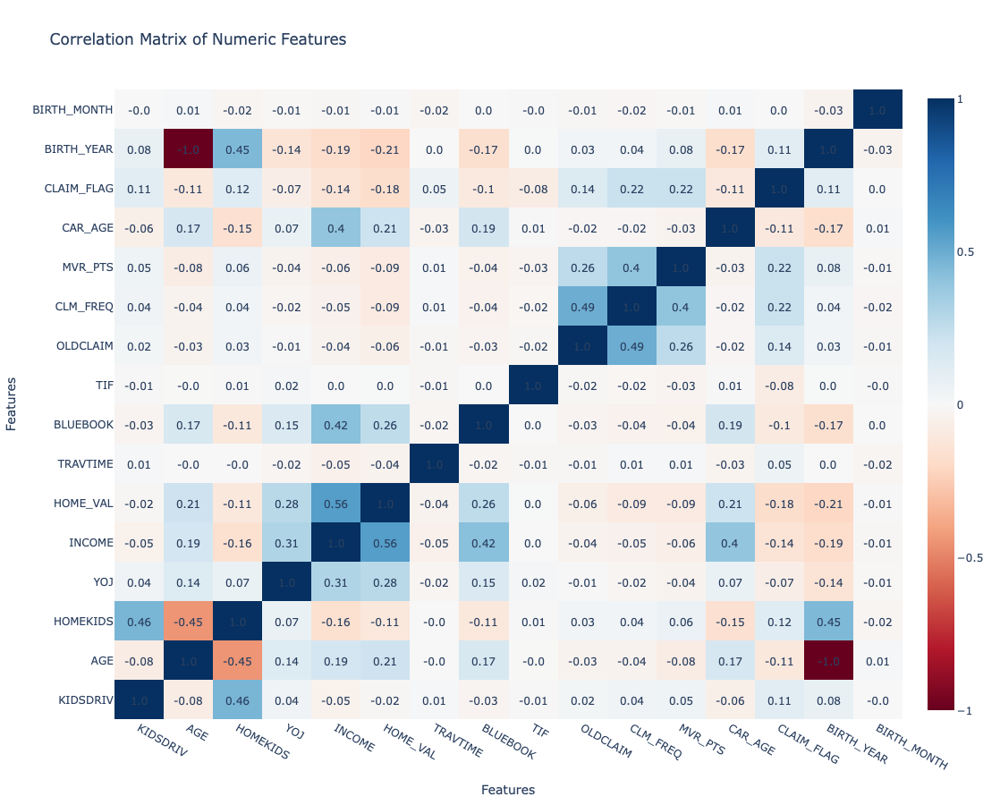

In [287]:
# only numeric columns
df_numeric = df.select_dtypes(include=[np.number])
# plot correlation matrix with 0 as white, -1 as dark blue and 1 as dark red
fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        z=df_numeric.corr(), 
        x=df_numeric.columns, 
        y=df_numeric.columns, 
        colorscale='RdBu', zmin=-1, zmax=1
    )
)

for i in range(len(df_numeric.columns)):
    for j in range(len(df_numeric.columns)):
        fig.add_annotation(
            x=df_numeric.columns[i], y=df_numeric.columns[j],
            text=str(round(df_numeric.corr().iloc[i, j], 2)),
            showarrow=False
        )

fig.update_layout(
    width=900, height=900,
    title='Correlation Matrix of Numeric Features',
    xaxis_title='Features',
    yaxis_title='Features'
)
fig.show()

### Univariate Histograms / Barplots

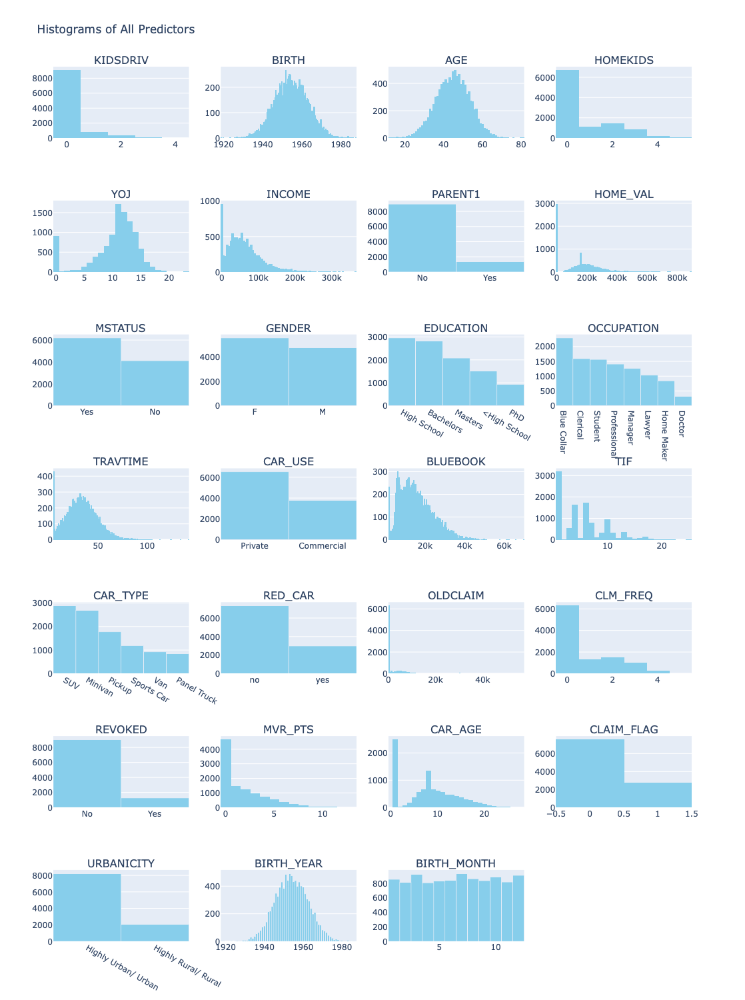

In [288]:
# histogram or bar plot of all predictors depending on the type of the predictor, in separate 26 subplots
fig = make_subplots(rows=7, cols=4, subplot_titles=df.columns)

for i, column in enumerate(df.columns):
    if df[column].dtype in [np.int64, np.float64] or column == 'BIRTH':
        fig.add_trace(
            go.Histogram(x=df[column], name=column, marker_color='skyblue'),
            row=i // 4 + 1, col=i % 4 + 1
        )
    else:
        fig.add_trace(
            go.Bar(x=df[column].value_counts().index, y=df[column].value_counts(), name=column, marker_color='skyblue'),
            row=i // 4 + 1, col=i % 4 + 1
        )

fig.update_layout(
    width=1000, height=1500,
    title='Histograms of All Predictors',
    showlegend=False
)

fig.show()

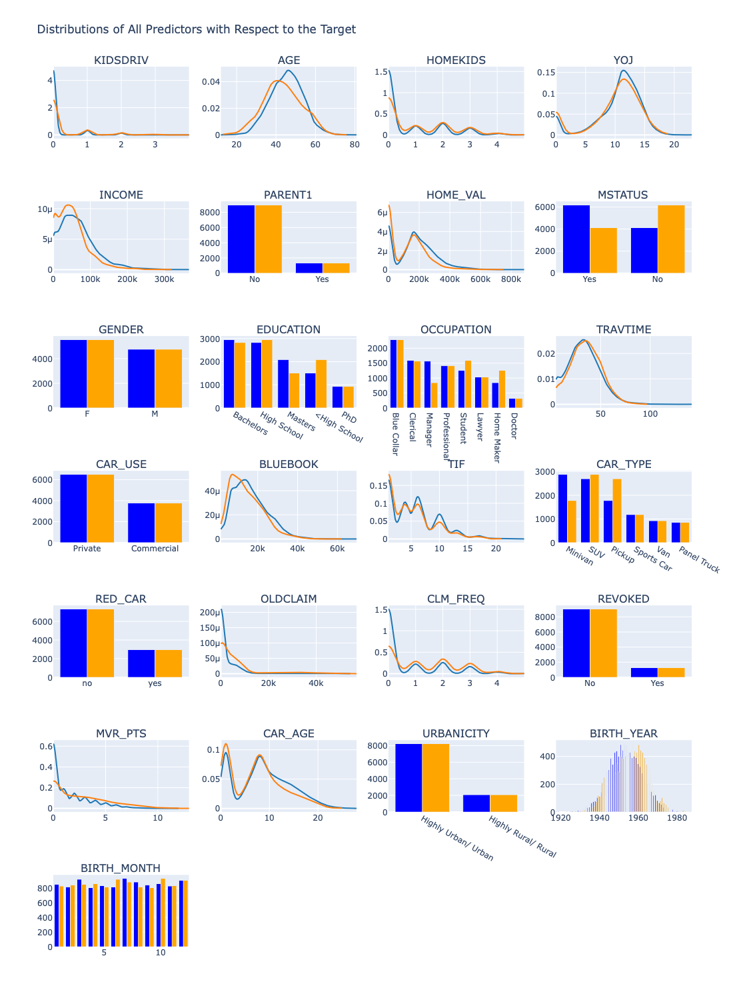

In [289]:
# with the idea above, create a figure with 26 subplots, each subplot showing the distribution of a predictor with respect to the target
viz_df = df.loc[:, (df.columns != 'CLAIM_FLAG') & (df.columns != 'BIRTH')]

fig = make_subplots(rows=7, cols=4, subplot_titles=viz_df.columns)

for i, column in enumerate(viz_df.columns):
    if df[column].dtype in [np.int64, np.float64]:
        fig1 = ff.create_distplot([df[column][df['CLAIM_FLAG'] == 0], df[column][df['CLAIM_FLAG'] == 1]], group_labels=['No Claim', 'Claim'], show_hist=False, show_rug=False)
        fig.add_trace(fig1['data'][0], row=i // 4 + 1, col=i % 4 + 1)
        fig.add_trace(fig1['data'][1], row=i // 4 + 1, col=i % 4 + 1)
    else:
        fig.add_trace(
            # with default color of blue for no claim and orange for claim
            go.Bar(x=df[column][df['CLAIM_FLAG'] == 0].value_counts().index, y=df[column].value_counts(), name=column, marker=dict(color='blue')),
            row=i // 4 + 1, col=i % 4 + 1
        )
        fig.add_trace(
            go.Bar(x=df[column][df['CLAIM_FLAG'] == 1].value_counts().index, y=df[column].value_counts(), name=column, marker=dict(color='orange')),
            row=i // 4 + 1, col=i % 4 + 1
        )

fig.update_layout(
    width=1000, height=1500,
    title='Distributions of All Predictors with Respect to the Target',
    showlegend=False
)

fig.show()

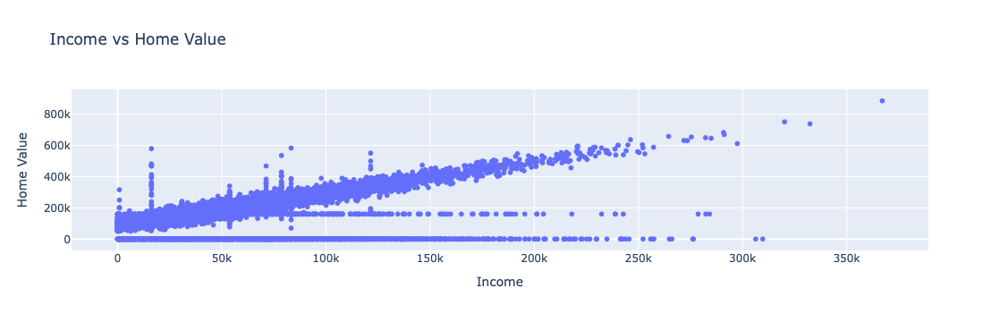

In [290]:
# income and home value
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df['INCOME'], 
        y=df['HOME_VAL'], 
        mode='markers'
    )
)
fig.update_layout(
    title='Income vs Home Value',
    xaxis_title='Income',
    yaxis_title='Home Value'
)
fig.show()

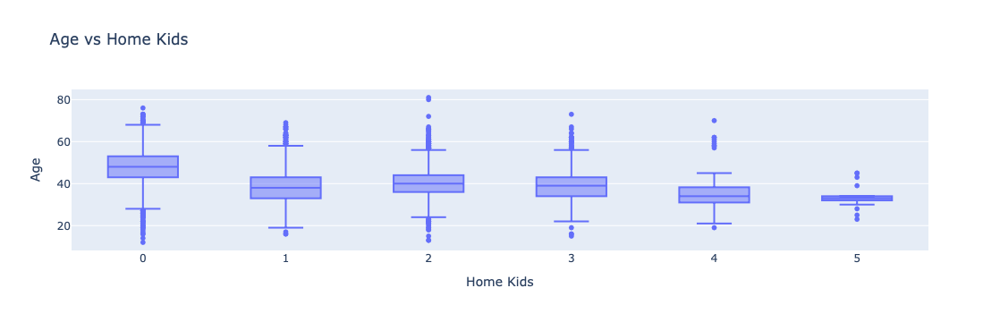

In [291]:
# age and homekids
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['HOMEKIDS'], 
        y=df['AGE'], 
    )
)
fig.update_layout(
    title='Age vs Home Kids',
    xaxis_title='Home Kids',
    yaxis_title='Age'
)
fig.show()

In [353]:
test=df.copy()

In [354]:
bins = [0, 16, 25, 35, 45, 55, 65, 75, 100]
labels = ['0-15', '15-25','25-35', '35-45', '45-55', '55-65', '65-75', '75-100']
test['AGE_GROUP'] = pd.cut(new_df['AGE'], bins=bins, labels=labels, right=False)

test['BLUEBOOK_GROUP'] = pd.qcut(new_df['BLUEBOOK'], q=5, labels=False)


In [355]:
def identify_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((data < lower_bound) | (data > upper_bound))

# Apply the function to each numeric column
outliers_count = test.select_dtypes(include=[np.number]).apply(identify_outliers_iqr).sum()
print("Number of outliers in each column:\n", outliers_count)



Number of outliers in each column:
 KIDSDRIV          1233
AGE                 47
HOMEKIDS          1075
YOJ                937
INCOME             348
HOME_VAL            26
TRAVTIME            80
BLUEBOOK           116
TIF                194
OLDCLAIM           837
CLM_FREQ             0
MVR_PTS            203
CAR_AGE              5
CLAIM_FLAG           0
BIRTH_YEAR          47
BIRTH_MONTH          0
BLUEBOOK_GROUP       0
dtype: int64


KIDSDRIV       1233
AGE              47
HOMEKIDS       1075
YOJ             937 --
INCOME          348 ++
HOME_VAL         26 ++
TRAVTIME         80 --
BLUEBOOK        116
TIF             194
OLDCLAIM        837 ? 
CLM_FREQ          0
MVR_PTS         203 ++
CAR_AGE           5
CLAIM_FLAG        0
BIRTH_YEAR       47
BIRTH_MONTH       0

In [356]:
outliers_cols=['INCOME','HOME_VAL','MVR_PTS']
#outliers_cols=['INCOME','HOME_VAL']

def IQR(data):
  Q1 = data.quantile(0.25)
  Q3 = data.quantile(0.75)

  IQR = Q3 - Q1
  LR = Q1 - (IQR * 1.5)
  UR = Q3 + (IQR * 1.5)

  return LR, UR

class_one = test[test['CLAIM_FLAG'] == 1]
class_zero = test[test['CLAIM_FLAG'] == 0]

LR1, UR1 = IQR(class_one.INCOME)
LR0, UR0 = IQR(class_zero.INCOME)
class_one = class_one[(class_one['INCOME'] > LR1) & (class_one['INCOME'] < UR1)]
class_zero = class_zero[(class_zero['INCOME'] > LR0) & (class_zero['INCOME'] < UR0)]


LR1, UR1 = IQR(class_one.HOME_VAL)
LR0, UR0 = IQR(class_zero.HOME_VAL)
class_one = class_one[(class_one['HOME_VAL'] > LR1) & (class_one['HOME_VAL'] < UR1)]
class_zero = class_zero[(class_zero['HOME_VAL'] > LR0) & (class_zero['HOME_VAL'] < UR0)]

LR1, UR1 = IQR(class_one.MVR_PTS)
LR0, UR0 = IQR(class_zero.MVR_PTS)
class_one = class_one[(class_one['MVR_PTS'] > LR1) & (class_one['MVR_PTS'] < UR1)]
class_zero = class_zero[(class_zero['MVR_PTS'] > LR0) & (class_zero['MVR_PTS'] < UR0)]


<Axes: xlabel='CLAIM_FLAG', ylabel='MVR_PTS'>

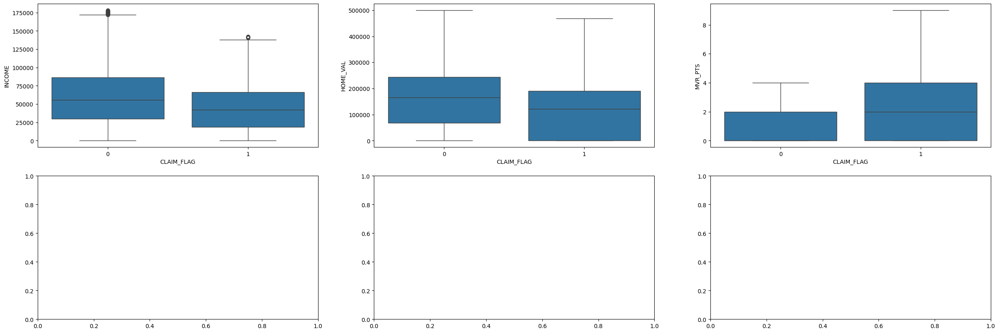

In [357]:
import matplotlib.pyplot as plt
import seaborn as sns
test = pd.concat([class_one, class_zero], axis = 0)


#DF2.drop('OLDCLAIM_converted', axis = 1, inplace = True)

figure, axis = plt.subplots(2,3, figsize = (30,10))
sns.boxplot(y = 'INCOME', x = 'CLAIM_FLAG', data = DF2, ax = axis[0,0])
sns.boxplot(y = 'HOME_VAL', x = 'CLAIM_FLAG', data = DF2, ax = axis[0,1])
sns.boxplot(y = 'MVR_PTS', x = 'CLAIM_FLAG', data = DF2, ax = axis[0,2])


In [231]:
df.to_csv('/Users/dhruvarora/Documents/UT Austin/Data Science Programming/Group Project/new_df.csv')

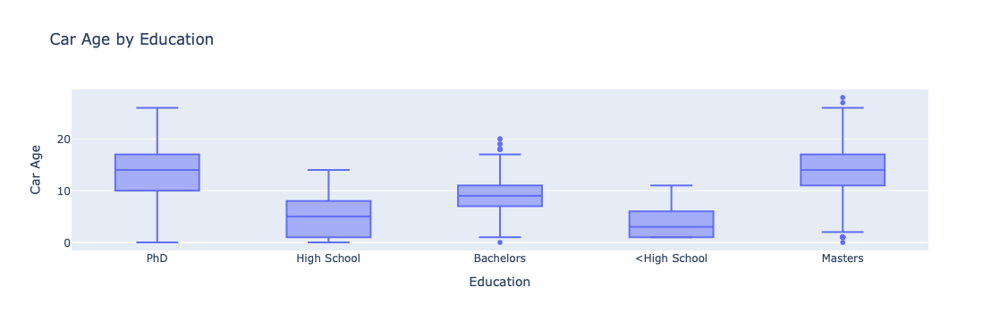

In [232]:
# carage by education
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['EDUCATION'], 
        y=df['CAR_AGE']
    )
)
fig.update_layout(
    title='Car Age by Education',
    xaxis_title='Education',
    yaxis_title='Car Age'
)
fig.show()

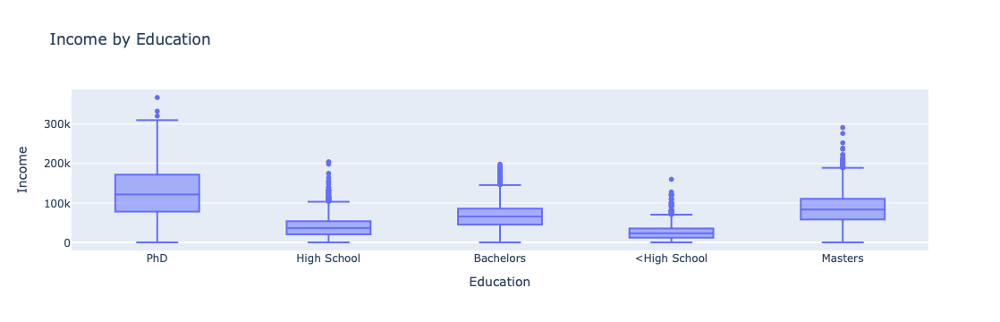

In [233]:
# income by education
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['EDUCATION'], 
        y=df['INCOME']
    )
)
fig.update_layout(
    title='Income by Education',
    xaxis_title='Education',
    yaxis_title='Income'
)
fig.show()

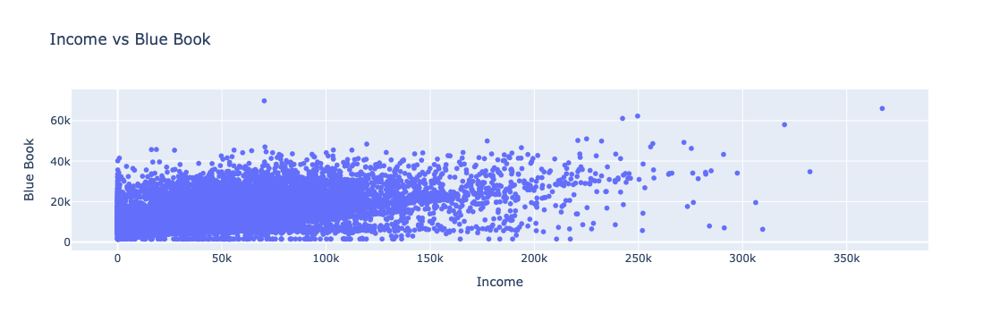

In [234]:
# income and bluebook
fig = go.Figure()
fig.add_trace(
    # scatter with alpha of dots as 0.5
    go.Scatter(
        x=df['INCOME'], 
        y=df['BLUEBOOK'], 
        mode='markers'
    )
)
fig.update_layout(
    title='Income vs Blue Book',
    xaxis_title='Income',
    yaxis_title='Blue Book'
)
fig.show()

## Drop `BIRTH`

In [358]:
test.drop('BIRTH', axis=1, inplace=True)

# Modeling

## Data Preparation

In [327]:
test.head()

,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,...,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,CLAIM_FLAG,URBANICITY,BIRTH_YEAR,BIRTH_MONTH,AGE_GROUP
6,0,34.0,1,12.0,125301.0,Yes,0.0,No,F,Bachelors,...,0.0,0,No,0,7.0,1,Highly Urban/ Urban,1965,5,25-35
8,1,40.0,1,11.0,50815.0,Yes,0.0,No,M,High School,...,3295.0,1,No,2,1.0,1,Highly Urban/ Urban,1959,9,35-45
11,0,34.0,0,10.0,62978.0,No,0.0,No,F,Bachelors,...,0.0,0,No,0,1.0,1,Highly Urban/ Urban,1964,11,25-35
13,0,53.0,0,14.0,77100.0,No,0.0,No,F,Masters,...,0.0,0,No,0,11.0,1,Highly Urban/ Urban,1945,12,45-55
16,0,53.0,0,11.0,130795.0,No,0.0,No,M,PhD,...,0.0,0,No,3,10.0,1,Highly Urban/ Urban,1946,7,45-55


### Check if a column is categorical

In [328]:
test.loc[:3].T

,6,8,11,13,16,18,20,24,25,30,...,10260,10264,10269,10285,10287,10293,0,1,2,3
KIDSDRIV,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AGE,34.0,40.0,34.0,53.0,53.0,45.0,59.0,28.0,43.0,60.0,...,47.0,43.0,46.0,41.0,45.0,51.0,60.0,43.0,48.0,35.0
HOMEKIDS,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
YOJ,12.0,11.0,10.0,14.0,11.0,0.0,12.0,13.0,13.0,12.0,...,11.0,0.0,10.0,12.0,11.0,10.0,11.0,11.0,11.0,10.0
INCOME,125301.0,50815.0,62978.0,77100.0,130795.0,0.0,87460.0,44077.0,37214.0,37940.0,...,112264.0,0.0,68360.0,92185.0,52966.0,128523.0,67349.0,91449.0,52881.0,16039.0
PARENT1,Yes,Yes,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
HOME_VAL,0.0,0.0,0.0,0.0,0.0,106859.0,0.0,170598.0,160020.5,182739.0,...,0.0,55203.0,237457.0,289370.0,0.0,0.0,0.0,257252.0,0.0,124191.0
MSTATUS,No,No,No,No,No,Yes,No,Yes,Yes,Yes,...,No,Yes,No,Yes,No,No,No,No,No,Yes
GENDER,F,M,F,F,M,F,M,F,M,F,...,M,F,M,M,M,M,M,M,M,F
EDUCATION,Bachelors,High School,Bachelors,Masters,PhD,<High School,High School,High School,<High School,High School,...,Masters,PhD,Bachelors,High School,High School,Masters,PhD,High School,Bachelors,High School


Most categorical variables are nominal except for `EDUCATION`

In [329]:
test.EDUCATION.value_counts()

EDUCATION
High School     2764
Bachelors       2577
Masters         1871
<High School    1411
PhD              651
Name: count, dtype: int64

In [359]:
ord_encoder = preprocessing.OrdinalEncoder(categories=[['<High School', 'High School', 'Bachelors', 'Masters', 'PhD']])
test['EDUCATION'] = ord_encoder.fit_transform(test[['EDUCATION']])
test['EDUCATION'].value_counts()

EDUCATION
1.0    2764
2.0    2577
3.0    1871
0.0    1411
4.0     651
Name: count, dtype: int64

### One-hot encoding

In [360]:
cat_list = ['PARENT1', 'MSTATUS', 'GENDER', 'OCCUPATION', 'CAR_USE',  'CAR_TYPE', 'RED_CAR', 'REVOKED', 'URBANICITY','AGE_GROUP','BLUEBOOK_GROUP']
formula = f"CLAIM_FLAG ~ 0 + {' + '.join([feature if feature not in cat_list else f'C({feature})' for feature in test.columns[test.columns != 'CLAIM_FLAG']])}"
formula

'CLAIM_FLAG ~ 0 + KIDSDRIV + AGE + HOMEKIDS + YOJ + INCOME + C(PARENT1) + HOME_VAL + C(MSTATUS) + C(GENDER) + EDUCATION + C(OCCUPATION) + TRAVTIME + C(CAR_USE) + BLUEBOOK + TIF + C(CAR_TYPE) + C(RED_CAR) + OLDCLAIM + CLM_FREQ + C(REVOKED) + MVR_PTS + CAR_AGE + C(URBANICITY) + BIRTH_YEAR + BIRTH_MONTH + C(AGE_GROUP) + C(BLUEBOOK_GROUP)'

In [361]:
Y, X = dmatrices(formula, test, return_type='dataframe')

In [362]:
X.head()

,C(PARENT1)[No],C(PARENT1)[Yes],C(MSTATUS)[T.Yes],C(GENDER)[T.M],C(OCCUPATION)[T.Clerical],C(OCCUPATION)[T.Doctor],C(OCCUPATION)[T.Home Maker],C(OCCUPATION)[T.Lawyer],C(OCCUPATION)[T.Manager],C(OCCUPATION)[T.Professional],...,EDUCATION,TRAVTIME,BLUEBOOK,TIF,OLDCLAIM,CLM_FREQ,MVR_PTS,CAR_AGE,BIRTH_YEAR,BIRTH_MONTH
6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,46.0,17430.0,1.0,0.0,0.0,0.0,7.0,1965.0,5.0
8,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,21.0,18930.0,6.0,3295.0,1.0,2.0,1.0,1959.0,9.0
11,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,2.0,34.0,11200.0,1.0,0.0,0.0,0.0,1.0,1964.0,11.0
13,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,3.0,15.0,18300.0,1.0,0.0,0.0,0.0,11.0,1945.0,12.0
16,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,64.0,28340.0,6.0,0.0,0.0,3.0,10.0,1946.0,7.0


In [363]:
X.columns

Index(['C(PARENT1)[No]', 'C(PARENT1)[Yes]', 'C(MSTATUS)[T.Yes]',
       'C(GENDER)[T.M]', 'C(OCCUPATION)[T.Clerical]',
       'C(OCCUPATION)[T.Doctor]', 'C(OCCUPATION)[T.Home Maker]',
       'C(OCCUPATION)[T.Lawyer]', 'C(OCCUPATION)[T.Manager]',
       'C(OCCUPATION)[T.Professional]', 'C(OCCUPATION)[T.Student]',
       'C(CAR_USE)[T.Private]', 'C(CAR_TYPE)[T.Panel Truck]',
       'C(CAR_TYPE)[T.Pickup]', 'C(CAR_TYPE)[T.SUV]',
       'C(CAR_TYPE)[T.Sports Car]', 'C(CAR_TYPE)[T.Van]', 'C(RED_CAR)[T.yes]',
       'C(REVOKED)[T.Yes]', 'C(URBANICITY)[T.Highly Urban/ Urban]',
       'C(AGE_GROUP)[T.15-25]', 'C(AGE_GROUP)[T.25-35]',
       'C(AGE_GROUP)[T.35-45]', 'C(AGE_GROUP)[T.45-55]',
       'C(AGE_GROUP)[T.55-65]', 'C(AGE_GROUP)[T.65-75]',
       'C(AGE_GROUP)[T.75-100]', 'C(BLUEBOOK_GROUP)[T.1]',
       'C(BLUEBOOK_GROUP)[T.2]', 'C(BLUEBOOK_GROUP)[T.3]',
       'C(BLUEBOOK_GROUP)[T.4]', 'KIDSDRIV', 'AGE', 'HOMEKIDS', 'YOJ',
       'INCOME', 'HOME_VAL', 'EDUCATION', 'TRAVTIME', 'BLUEBOOK

In [364]:
Y.head()

,CLAIM_FLAG
6,1.0
8,1.0
11,1.0
13,1.0
16,1.0


### Train Test Split

In [365]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=0)
Y_train = Y_train.values.ravel()
Y_test = Y_test.values.ravel()

### Scaling

In [366]:
scaler = preprocessing.MinMaxScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### Logistic Regression

In [367]:
model = LogisticRegression(random_state=0)
model.fit(X_train, Y_train.ravel())

LogisticRegression(random_state=0)

In [368]:
Y_pred = model.predict(X_test)

print('Accuracy of logistic regression classifier on test set: {:.4f}'.format(model.score(X_test, Y_test)))

Accuracy of logistic regression classifier on test set: 0.7917


In [369]:
# Confusion Matrix
confusion_matrix = metrics.confusion_matrix(Y_test, Y_pred)
print(confusion_matrix)

[[1493  157]
 [ 326  343]]


In [370]:
# Classification Report
print(metrics.classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

         0.0       0.82      0.90      0.86      1650
         1.0       0.69      0.51      0.59       669

    accuracy                           0.79      2319
   macro avg       0.75      0.71      0.72      2319
weighted avg       0.78      0.79      0.78      2319



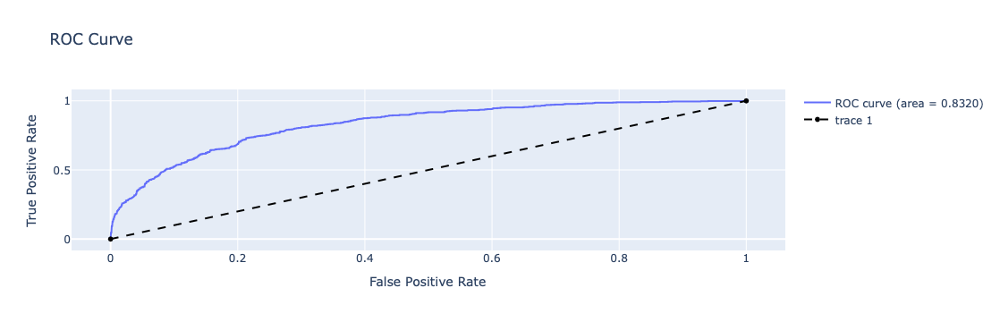

In [371]:
# ROC Curve
Y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_test, Y_pred_proba)
auc = metrics.roc_auc_score(Y_test, Y_pred_proba)

fig = go.Figure()
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='ROC curve (area = %0.4f)' % auc))
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], line=dict(color='black', dash='dash')))
fig.update_layout(title='ROC Curve', xaxis_title='False Positive Rate', yaxis_title='True Positive Rate')
fig.show()

### GBM

In [372]:
gbm = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=0
)

gbm.fit(X_train, Y_train)

GradientBoostingClassifier(random_state=0)

In [373]:
Y_pred = gbm.predict(X_test)
print('Accuracy of Gradient Boosting Classifier on test set: {:.4f}'.format(gbm.score(X_test, Y_test)))

Accuracy of Gradient Boosting Classifier on test set: 0.7978


In [374]:
scores_df = DataFrame(columns=['num_trees', 'max_depth', 'accuracy'])

for num_trees in [50, 100, 200, 300, 400]:
    for max_depth in [2, 3, 4, 5]:
        model = GradientBoostingClassifier(n_estimators=num_trees,
                                           max_depth=max_depth,
                                           random_state=1)
        model.fit(X_train, Y_train)
        prediction_test = model.predict(X_test)
        accuracy_test = metrics.accuracy_score(Y_test, prediction_test)
        scores_df = pd.concat([scores_df, DataFrame([[num_trees, max_depth, accuracy_test]], columns=['num_trees', 'max_depth', 'accuracy'])])

scores_df

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_85661/2847858301.py:11: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



,num_trees,max_depth,accuracy
0,50,2,0.784390
0,50,3,0.789564
0,50,4,0.793445
0,50,5,0.793014
0,100,2,0.791721
0,100,3,0.797758
0,100,4,0.800776
0,100,5,0.802932
0,200,2,0.799051
0,200,3,0.803364


In [375]:
import copy

new_df = copy.deepcopy(df)


In [376]:
y_train = Y_train
y_test = Y_test

In [377]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix


# Apply SMOTE with a 60:40 split (minority class to majority class)
smote = SMOTE(sampling_strategy=0.50, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Train the model
model = GradientBoostingClassifier(n_estimators=100,
                                           max_depth=4,
                                           random_state=1)
model.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[1521  129]
 [ 321  348]]
              precision    recall  f1-score   support

         0.0       0.83      0.92      0.87      1650
         1.0       0.73      0.52      0.61       669

    accuracy                           0.81      2319
   macro avg       0.78      0.72      0.74      2319
weighted avg       0.80      0.81      0.80      2319



                                 Feature  Importance
39                               MVR_PTS    0.329584
38                              CLM_FREQ    0.127670
19  C(URBANICITY)[T.Highly Urban/ Urban]    0.085754
33                             EDUCATION    0.062223
37                              OLDCLAIM    0.055490
32                              HOME_VAL    0.044789
11                 C(CAR_USE)[T.Private]    0.033096
31                                INCOME    0.031731
27                              KIDSDRIV    0.027065
18                     C(REVOKED)[T.Yes]    0.026247
36                                   TIF    0.025516
34                              TRAVTIME    0.019249
8               C(OCCUPATION)[T.Manager]    0.017964
35                              BLUEBOOK    0.017904
28                                   AGE    0.015957


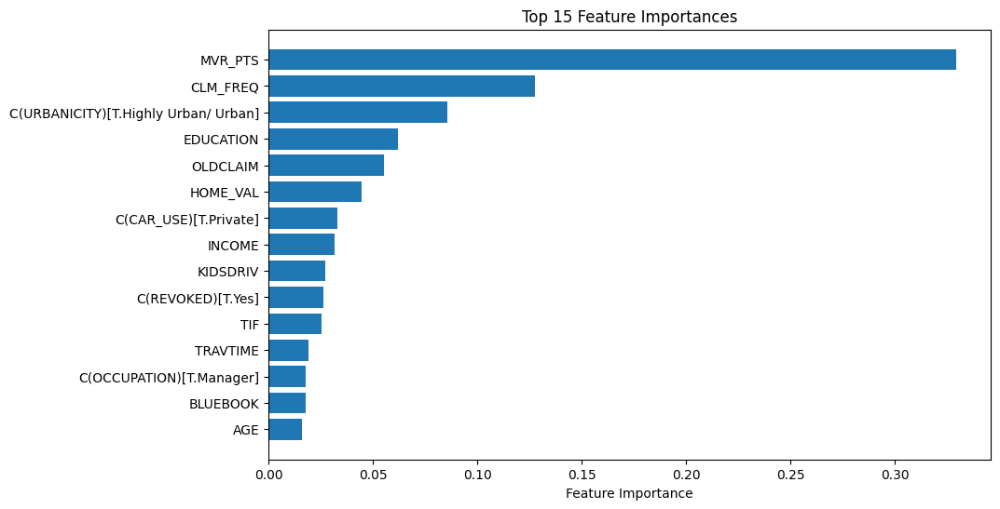

In [349]:
import matplotlib.pyplot as plt
# Extract feature importances
feature_importances = model.feature_importances_

features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance in descending order
features_df = features_df.sort_values(by='Importance', ascending=False)

# Display the top 15 most important features
top_15_features = features_df.head(15)
print(top_15_features)

# Plot the top 15 most important features
plt.figure(figsize=(10, 6))
plt.title("Top 15 Feature Importances")
plt.barh(top_15_features['Feature'], top_15_features['Importance'], align="center")
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.xlabel("Feature Importance")
plt.show()

In [259]:
# Initialize the XGBoost classifier

import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV

xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=1)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.2],
    'reg_alpha': [0, 0.5],
    'reg_lambda': [1, 2],
    'min_child_weight': [1, 3, 5]
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring='accuracy', cv=3, n_jobs=2, verbose=2)


In [260]:
#Fit the model using GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

#Print the best parameters and best score
print("Best Parameters: ", grid_search.best_params_)
print("Best Cross-Validation Score: ", grid_search.best_score_)

Fitting 3 folds for each of 1728 candidates, totalling 5184 fits


/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, su

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, su

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:40:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsampl

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsam

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsam

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:41:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alp

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5, re

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alp

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0.5, re

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:42:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_la

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, re

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:14] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:14] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:15] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:15] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lamb

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:40] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lamb

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, su

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:47] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:47] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:47] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:47] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:43:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lamb

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=1

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lamb

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=1

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subs

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subs

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:46] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alp

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:49] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:49] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:49] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:50] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:44:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.5, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0.5, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=0.5, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alp

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lamb

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, 

/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:45:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/lib/python3.12/site-

Best Parameters:  {'colsample_bytree': 1.0, 'gamma': 0.2, 'learning_rate': 0.05, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'reg_alpha': 0.5, 'reg_lambda': 1, 'subsample': 0.8}
Best Cross-Validation Score:  0.8029315960912052
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, ma

In [183]:
# Make predictions on the test set using the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1500  150]
 [ 314  355]]
              precision    recall  f1-score   support

         0.0       0.83      0.91      0.87      1650
         1.0       0.70      0.53      0.60       669

    accuracy                           0.80      2319
   macro avg       0.76      0.72      0.74      2319
weighted avg       0.79      0.80      0.79      2319

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=0, 

                                 Feature  Importance
32                               MVR_PTS    0.130020
19  C(URBANICITY)[T.Highly Urban/ Urban]    0.125080
31                              CLM_FREQ    0.073085
26                             EDUCATION    0.061374
8               C(OCCUPATION)[T.Manager]    0.045436
11                 C(CAR_USE)[T.Private]    0.045422
30                              OLDCLAIM    0.044490
18                     C(REVOKED)[T.Yes]    0.036474
20                              KIDSDRIV    0.032956
25                              HOME_VAL    0.027203
0                         C(PARENT1)[No]    0.026100
2                      C(MSTATUS)[T.Yes]    0.024293
22                              HOMEKIDS    0.022916
29                                   TIF    0.019578
15             C(CAR_TYPE)[T.Sports Car]    0.019216


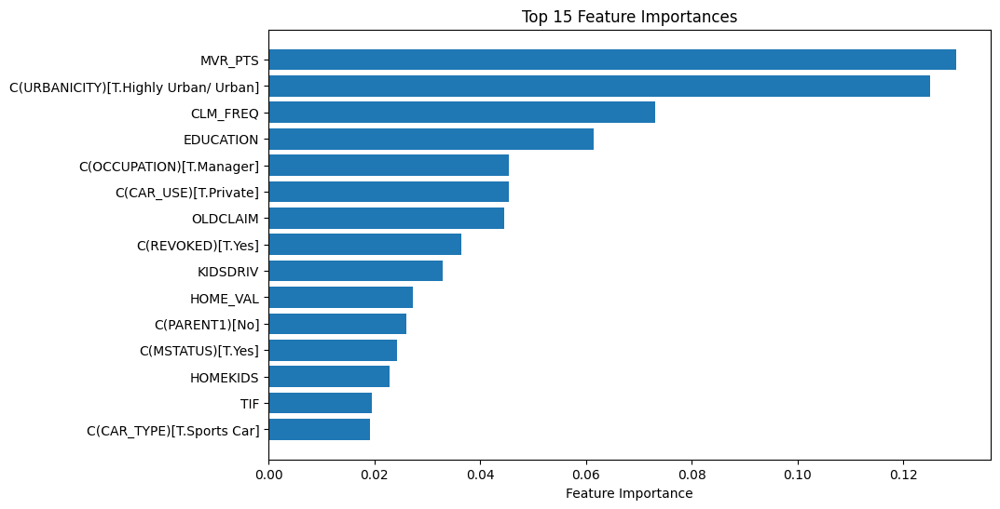

In [188]:
import matplotlib.pyplot as plt
# Extract feature importances
feature_importances = best_model.feature_importances_

features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance in descending order
features_df = features_df.sort_values(by='Importance', ascending=False)

# Display the top 15 most important features
top_15_features = features_df.head(15)
print(top_15_features)

# Plot the top 15 most important features
plt.figure(figsize=(10, 6))
plt.title("Top 15 Feature Importances")
plt.barh(top_15_features['Feature'], top_15_features['Importance'], align="center")
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.xlabel("Feature Importance")
plt.show()

###Analysis

In [194]:
# car type analysis
ct_ana=df[['CAR_TYPE','CLAIM_FLAG']]


CAR_TYPE     CLAIM_FLAG
Minivan      0             2229
SUV          0             2042
Pickup       0             1217
SUV          1              841
Sports Car   0              771
Van          0              669
Panel Truck  0              628
Pickup       1              555
Minivan      1              465
Sports Car   1              408
Van          1              252
Panel Truck  1              225
Name: count, dtype: int64

In [197]:
abc=ct_ana.groupby('CAR_TYPE').agg(['sum','count'])

CLAIM_FLAG      
                   sum count
CAR_TYPE                    
Minivan            465  2694
Panel Truck        225   853
Pickup             555  1772
SUV                841  2883
Sports Car         408  1179
Van                252   921

In [187]:
df.columns

Index(['KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME', 'PARENT1',
       'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION', 'TRAVTIME',
       'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR', 'OLDCLAIM',
       'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CAR_AGE', 'CLAIM_FLAG', 'URBANICITY',
       'BIRTH_YEAR', 'BIRTH_MONTH'],
      dtype='object')